In [1]:
from keras.models import load_model
import cv2
import numpy as np
from PIL import Image
from keras import models
import argparse
import random
import time
import keras
from keras.models import Sequential
from keras.layers import Dense
from sklearn.datasets import make_regression
from sklearn.preprocessing import MinMaxScaler
from keras.preprocessing import image

Using TensorFlow backend.


In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb
from pandas.plotting import scatter_matrix
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV
from sklearn import svm
from xgboost.sklearn import XGBClassifier

In [9]:
from sklearn.externals import joblib

/usr/local/lib/python3.6/dist-packages/sklearn/externals/joblib/__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


In [37]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
from google.colab import files

In [0]:
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

     # 1. Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [0]:
xgbpkl1 = drive.CreateFile({'id':'1ZfBNA7g7PXsh8of6VAHPcBkMUIzVQSwd'}) 
xgbpkl1.GetContentFile('SVM1.pkl')


In [0]:
xgbpkl = drive.CreateFile({'id':'1yMfzbouWfNAX2ofI4_lWaZJepZPvyUoJ'}) 
xgbpkl.GetContentFile('XGb.pkl')

In [0]:
fittedModel1 = joblib.load('SVM1.pkl')
#fittedModel.predict(X_new)

In [0]:
fittedModel = joblib.load('XGb.pkl')

In [0]:
last_weight_file = drive.CreateFile({'id':'1Eaquk8Rlq6jPpNi3Wu-sLGhTk2L4pszv'}) 
last_weight_file.GetContentFile('final.h5')

In [13]:
from keras import models
model=models.load_model('./final.h5')

















Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where




In [0]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import pickle
from collections import defaultdict
from sklearn.externals import joblib
from scipy.special import entr
import glob

In [63]:
dataset = pd.read_csv('/content/drive/My Drive/FinalDatasheet.csv')
print(len(dataset))
print(dataset.head())

800
   Cardboard=0   glass=1    Metal=2  ...   entropy  predicted  erro1/not an error
0    93.690941  0.002436   2.615459  ...  0.278402          0                   0
1     0.095962  0.000020  98.806129  ...  0.068082          2                   1
2    98.608109  0.000618   1.073514  ...  0.080863          0                   0
3     0.696257  0.000014   7.458564  ...  0.306326          3                   1
4    67.259476  0.001402  26.033657  ...  0.818766          0                   0

[5 rows x 11 columns]


In [0]:
dataset = dataset.drop('Cardboard=0',axis=1)
dataset = dataset.drop('glass=1',axis=1)
dataset = dataset.drop('Metal=2',axis=1)
dataset = dataset.drop('Plastic=3',axis=1)
dataset = dataset.drop('Paper=4',axis=1)

In [65]:
x = dataset.iloc[:,0:5]
y = dataset.iloc[:,5]
data_dmatrix = xgb.DMatrix(data=x,label=y)
x_train, x_test, y_train,y_test = train_test_split(x,y,random_state=2, test_size=0.2)

/usr/local/lib/python3.6/dist-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/usr/local/lib/python3.6/dist-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


In [66]:
x_train = x_train.as_matrix()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """Entry point for launching an IPython kernel.


In [67]:
xgb_model = xgb.XGBClassifier(learning_rate =0.01,
    n_estimators=500,
    max_depth = 3,
    min_child_weight = 1,
    gamma=0.1,
    subsample=0.45,
    colsample_bytree=0.9,
    reg_alpha=1,
    objective= 'binary:logistic',
    nthread=4,
    scale_pos_weight=1.3,
    seed=0)

xgb_model.fit(x_train, y_train)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.9, gamma=0.1,
              learning_rate=0.01, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=500, n_jobs=1,
              nthread=4, objective='binary:logistic', random_state=0,
              reg_alpha=1, reg_lambda=1, scale_pos_weight=1.3, seed=0,
              silent=None, subsample=0.45, verbosity=1)

In [46]:
clf = svm.SVC( C=2.5, kernel='rbf', gamma=2.1,class_weight=None)
clf.fit(x_train, y_train)

SVC(C=2.5, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=2.1, kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [0]:
from google.colab.patches import cv2_imshow

In [0]:
'''
'Cardboard=0'
'glass=1'
'Metal=2'
'Plastic=3'
'Paper=4'
'''

1
[1]
[1]
(5, 1)
[[1.18897271e+00 5.10256805e+02 2.66148150e-01 5.93928158e-01
  1.00000000e+00]]


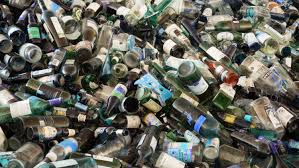

what is this?
1
[1. 0. 0. 0. 0.]
[[1. 0. 0. 0. 0.]]
Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.0419 - acc: 1.0000
Epoch 2/20
1/1 [==============================] - 1s 1s/step - loss: 0.0373 - acc: 1.0000
Epoch 3/20
1/1 [==============================] - 1s 1s/step - loss: 0.0333 - acc: 1.0000
Epoch 4/20
1/1 [==============================] - 1s 1s/step - loss: 0.0298 - acc: 1.0000
Epoch 5/20
1/1 [==============================] - 1s 1s/step - loss: 0.0268 - acc: 1.0000
Epoch 6/20
1/1 [==============================] - 1s 1s/step - loss: 0.0242 - acc: 1.0000
Epoch 7/20
1/1 [==============================] - 1s 1s/step - loss: 0.0220 - acc: 1.0000
Epoch 8/20
1/1 [==============================] - 1s 1s/step - loss: 0.0201 - acc: 1.0000
Epoch 9/20
1/1 [==============================] - 1s 1s/step - loss: 0.0185 - acc: 1.0000
Epoch 10/20
1/1 [==============================] - 1s 1s/step - loss: 0.0171 - acc: 1.0000
Epoch 11/20
1/1 [==============================

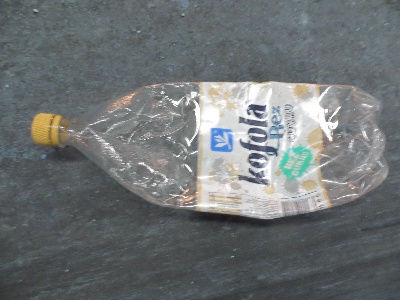

what is this?
3
[0. 0. 1. 0. 0.]
[[0. 0. 1. 0. 0.]]
Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0227 - acc: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 1s 1s/step - loss: 0.8221 - acc: 1.0000
Epoch 3/20
1/1 [==============================] - 1s 1s/step - loss: 0.6621 - acc: 1.0000
Epoch 4/20
1/1 [==============================] - 1s 1s/step - loss: 0.5265 - acc: 1.0000
Epoch 5/20
1/1 [==============================] - 1s 1s/step - loss: 0.4205 - acc: 1.0000
Epoch 6/20
1/1 [==============================] - 1s 1s/step - loss: 0.3360 - acc: 1.0000
Epoch 7/20
1/1 [==============================] - 1s 1s/step - loss: 0.2704 - acc: 1.0000
Epoch 8/20
1/1 [==============================] - 1s 1s/step - loss: 0.2190 - acc: 1.0000
Epoch 9/20
1/1 [==============================] - 1s 1s/step - loss: 0.1793 - acc: 1.0000
Epoch 10/20
1/1 [==============================] - 1s 1s/step - loss: 0.1483 - acc: 1.0000
Epoch 11/20
1/1 [==========================

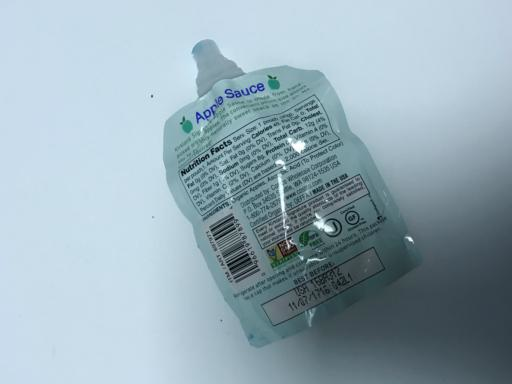

what is this?
3
[0. 0. 1. 0. 0.]
[[0. 0. 1. 0. 0.]]
Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 2.4467 - acc: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 1s 1s/step - loss: 2.0246 - acc: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 1s 1s/step - loss: 1.5382 - acc: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 1s 1s/step - loss: 1.0891 - acc: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 1s 1s/step - loss: 0.7368 - acc: 1.0000
Epoch 6/20
1/1 [==============================] - 1s 1s/step - loss: 0.4917 - acc: 1.0000
Epoch 7/20
1/1 [==============================] - 1s 1s/step - loss: 0.3307 - acc: 1.0000
Epoch 8/20
1/1 [==============================] - 1s 1s/step - loss: 0.2265 - acc: 1.0000
Epoch 9/20
1/1 [==============================] - 1s 1s/step - loss: 0.1601 - acc: 1.0000
Epoch 10/20
1/1 [==============================] - 1s 1s/step - loss: 0.1164 - acc: 1.0000
Epoch 11/20
1/1 [==============

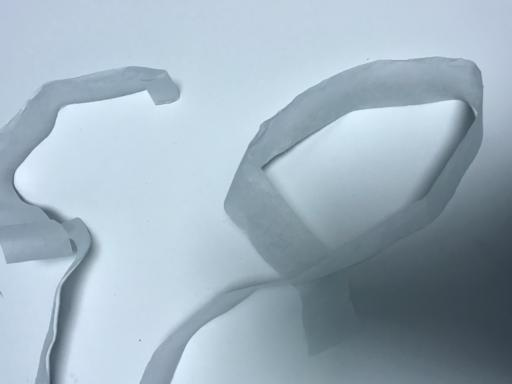

what is this?
4
[0. 0. 0. 1. 0.]
[[0. 0. 0. 1. 0.]]
Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 4.4469 - acc: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 1s 1s/step - loss: 3.8798 - acc: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 1s 1s/step - loss: 3.2521 - acc: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 1s 1s/step - loss: 2.6119 - acc: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 1s 1s/step - loss: 2.0172 - acc: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 1s 1s/step - loss: 1.4900 - acc: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 1s 1s/step - loss: 1.0493 - acc: 0.0000e+00
Epoch 8/20
1/1 [==============================] - 1s 1s/step - loss: 0.7134 - acc: 1.0000
Epoch 9/20
1/1 [==============================] - 1s 1s/step - loss: 0.4776 - acc: 1.0000
Epoch 10/20
1/1 [==============================] - 1s 1s/step - loss: 0.3237 - acc: 1.0000
Epoch 11/20
1/1 [==

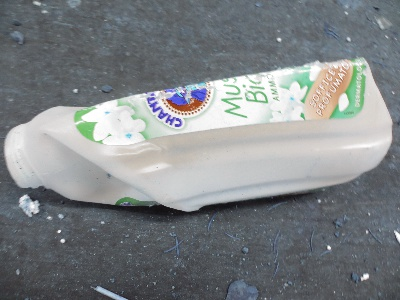

what is this?
3
[0. 0. 1. 0. 0.]
[[0. 0. 1. 0. 0.]]
Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.3843 - acc: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 1s 1s/step - loss: 1.1479 - acc: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 1s 1s/step - loss: 0.8895 - acc: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 1s 1s/step - loss: 0.6698 - acc: 1.0000
Epoch 5/20
1/1 [==============================] - 1s 1s/step - loss: 0.4965 - acc: 1.0000
Epoch 6/20
1/1 [==============================] - 1s 1s/step - loss: 0.3697 - acc: 1.0000
Epoch 7/20
1/1 [==============================] - 1s 1s/step - loss: 0.2781 - acc: 1.0000
Epoch 8/20
1/1 [==============================] - 1s 1s/step - loss: 0.2145 - acc: 1.0000
Epoch 9/20
1/1 [==============================] - 1s 1s/step - loss: 0.1687 - acc: 1.0000
Epoch 10/20
1/1 [==============================] - 1s 1s/step - loss: 0.1347 - acc: 1.0000
Epoch 11/20
1/1 [==================

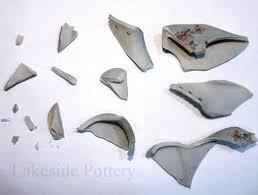

what is this?
1
[1. 0. 0. 0. 0.]
[[1. 0. 0. 0. 0.]]
Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 3.4521 - acc: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 1s 1s/step - loss: 2.8966 - acc: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 1s 1s/step - loss: 2.3280 - acc: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 1s 1s/step - loss: 1.8035 - acc: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 1s 1s/step - loss: 1.3217 - acc: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 1s 1s/step - loss: 0.9297 - acc: 1.0000
Epoch 7/20
1/1 [==============================] - 1s 1s/step - loss: 0.6349 - acc: 1.0000
Epoch 8/20
1/1 [==============================] - 1s 1s/step - loss: 0.4296 - acc: 1.0000
Epoch 9/20
1/1 [==============================] - 1s 1s/step - loss: 0.2947 - acc: 1.0000
Epoch 10/20
1/1 [==============================] - 1s 1s/step - loss: 0.2063 - acc: 1.0000
Epoch 11/20
1/1 [==========

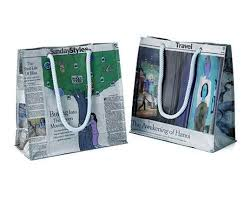

what is this?
4
[0. 0. 0. 1. 0.]
[[0. 0. 0. 1. 0.]]
Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 2.2174 - acc: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 1s 1s/step - loss: 1.8685 - acc: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 1s 1s/step - loss: 1.4822 - acc: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 1s 1s/step - loss: 1.1137 - acc: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 1s 1s/step - loss: 0.8125 - acc: 1.0000
Epoch 6/20
1/1 [==============================] - 1s 1s/step - loss: 0.5818 - acc: 1.0000
Epoch 7/20
1/1 [==============================] - 1s 1s/step - loss: 0.4166 - acc: 1.0000
Epoch 8/20
1/1 [==============================] - 1s 1s/step - loss: 0.3004 - acc: 1.0000
Epoch 9/20
1/1 [==============================] - 1s 1s/step - loss: 0.2211 - acc: 1.0000
Epoch 10/20
1/1 [==============================] - 1s 1s/step - loss: 0.1653 - acc: 1.0000
Epoch 11/20
1/1 [==============

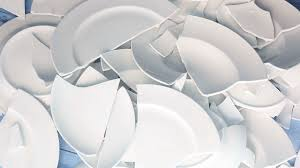

what is this?
1
[1. 0. 0. 0. 0.]
[[1. 0. 0. 0. 0.]]
Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.5238 - acc: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 1s 1s/step - loss: 1.1796 - acc: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 1s 1s/step - loss: 0.8698 - acc: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 1s 1s/step - loss: 0.6250 - acc: 1.0000
Epoch 5/20
1/1 [==============================] - 1s 1s/step - loss: 0.4429 - acc: 1.0000
Epoch 6/20
1/1 [==============================] - 1s 1s/step - loss: 0.3168 - acc: 1.0000
Epoch 7/20
1/1 [==============================] - 1s 1s/step - loss: 0.2313 - acc: 1.0000
Epoch 8/20
1/1 [==============================] - 1s 1s/step - loss: 0.1733 - acc: 1.0000
Epoch 9/20
1/1 [==============================] - 1s 1s/step - loss: 0.1329 - acc: 1.0000
Epoch 10/20
1/1 [==============================] - 1s 1s/step - loss: 0.1040 - acc: 1.0000
Epoch 11/20
1/1 [==================

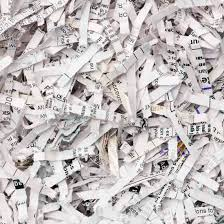

what is this?
4
[0. 0. 0. 1. 0.]
[[0. 0. 0. 1. 0.]]
Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.3165 - acc: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 1s 1s/step - loss: 0.9355 - acc: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 1s 1s/step - loss: 0.6417 - acc: 1.0000
Epoch 4/20
1/1 [==============================] - 1s 1s/step - loss: 0.4467 - acc: 1.0000
Epoch 5/20
1/1 [==============================] - 1s 1s/step - loss: 0.3165 - acc: 1.0000
Epoch 6/20
1/1 [==============================] - 1s 1s/step - loss: 0.2303 - acc: 1.0000
Epoch 7/20
1/1 [==============================] - 1s 1s/step - loss: 0.1719 - acc: 1.0000
Epoch 8/20
1/1 [==============================] - 1s 1s/step - loss: 0.1317 - acc: 1.0000
Epoch 9/20
1/1 [==============================] - 1s 1s/step - loss: 0.1041 - acc: 1.0000
Epoch 10/20
1/1 [==============================] - 1s 1s/step - loss: 0.0845 - acc: 1.0000
Epoch 11/20
1/1 [======================

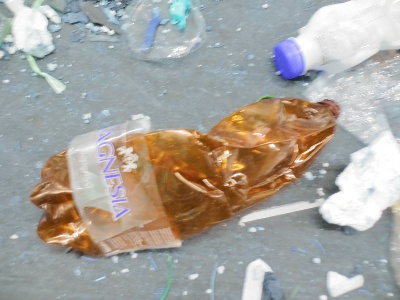

what is this?
3
[0. 0. 1. 0. 0.]
[[0. 0. 1. 0. 0.]]
Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 3.6278 - acc: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 1s 1s/step - loss: 3.1827 - acc: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 1s 1s/step - loss: 2.6578 - acc: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 1s 1s/step - loss: 2.1178 - acc: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 1s 1s/step - loss: 1.6025 - acc: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 1s 1s/step - loss: 1.1543 - acc: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 1s 1s/step - loss: 0.7951 - acc: 1.0000
Epoch 8/20
1/1 [==============================] - 1s 1s/step - loss: 0.5331 - acc: 1.0000
Epoch 9/20
1/1 [==============================] - 1s 1s/step - loss: 0.3568 - acc: 1.0000
Epoch 10/20
1/1 [==============================] - 1s 1s/step - loss: 0.2430 - acc: 1.0000
Epoch 11/20
1/1 [======

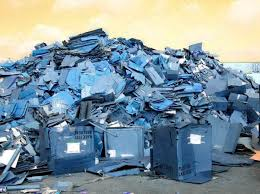

what is this?
2
[0. 1. 0. 0. 0.]
[[0. 1. 0. 0. 0.]]
Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 5.1067 - acc: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 1s 1s/step - loss: 4.6482 - acc: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 1s 1s/step - loss: 4.1145 - acc: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 1s 1s/step - loss: 3.5639 - acc: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 1s 1s/step - loss: 2.9854 - acc: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 1s 1s/step - loss: 2.4006 - acc: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 1s 1s/step - loss: 1.8410 - acc: 0.0000e+00
Epoch 8/20
1/1 [==============================] - 1s 1s/step - loss: 1.3432 - acc: 0.0000e+00
Epoch 9/20
1/1 [==============================] - 1s 1s/step - loss: 0.9320 - acc: 1.0000
Epoch 10/20
1/1 [==============================] - 1s 1s/step - loss: 0.6272 - acc: 1.0000
Epoch 11/20
1/1

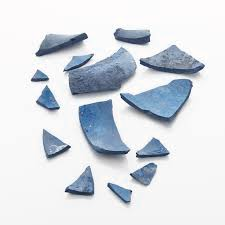

what is this?
1
[1. 0. 0. 0. 0.]
[[1. 0. 0. 0. 0.]]
Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 2.3565 - acc: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 1s 1s/step - loss: 2.0276 - acc: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 1s 1s/step - loss: 1.6530 - acc: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 1s 1s/step - loss: 1.3029 - acc: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 1s 1s/step - loss: 0.9688 - acc: 1.0000
Epoch 6/20
1/1 [==============================] - 1s 1s/step - loss: 0.6987 - acc: 1.0000
Epoch 7/20
1/1 [==============================] - 1s 1s/step - loss: 0.4983 - acc: 1.0000
Epoch 8/20
1/1 [==============================] - 1s 1s/step - loss: 0.3545 - acc: 1.0000
Epoch 9/20
1/1 [==============================] - 1s 1s/step - loss: 0.2557 - acc: 1.0000
Epoch 10/20
1/1 [==============================] - 1s 1s/step - loss: 0.1891 - acc: 1.0000
Epoch 11/20
1/1 [==============

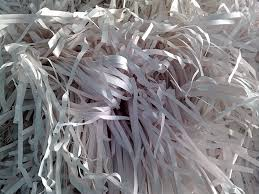

what is this?
4
[0. 0. 0. 1. 0.]
[[0. 0. 0. 1. 0.]]
Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 3.3120 - acc: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 1s 1s/step - loss: 2.8479 - acc: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 1s 1s/step - loss: 2.3227 - acc: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 1s 1s/step - loss: 1.8137 - acc: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 1s 1s/step - loss: 1.3434 - acc: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 1s 1s/step - loss: 0.9544 - acc: 1.0000
Epoch 7/20
1/1 [==============================] - 1s 1s/step - loss: 0.6561 - acc: 1.0000
Epoch 8/20
1/1 [==============================] - 1s 1s/step - loss: 0.4490 - acc: 1.0000
Epoch 9/20
1/1 [==============================] - 1s 1s/step - loss: 0.3097 - acc: 1.0000
Epoch 10/20
1/1 [==============================] - 1s 1s/step - loss: 0.2207 - acc: 1.0000
Epoch 11/20
1/1 [==========

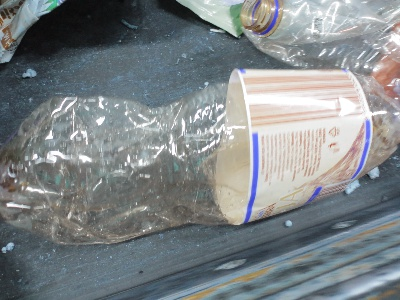

what is this?
3
[0. 0. 1. 0. 0.]
[[0. 0. 1. 0. 0.]]
Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 2.8392 - acc: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 1s 1s/step - loss: 2.4140 - acc: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 1s 1s/step - loss: 1.9446 - acc: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 1s 1s/step - loss: 1.4772 - acc: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 1s 1s/step - loss: 1.0820 - acc: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 1s 1s/step - loss: 0.7767 - acc: 1.0000
Epoch 7/20
1/1 [==============================] - 1s 1s/step - loss: 0.5473 - acc: 1.0000
Epoch 8/20
1/1 [==============================] - 1s 1s/step - loss: 0.3867 - acc: 1.0000
Epoch 9/20
1/1 [==============================] - 1s 1s/step - loss: 0.2772 - acc: 1.0000
Epoch 10/20
1/1 [==============================] - 1s 1s/step - loss: 0.2023 - acc: 1.0000
Epoch 11/20
1/1 [==========

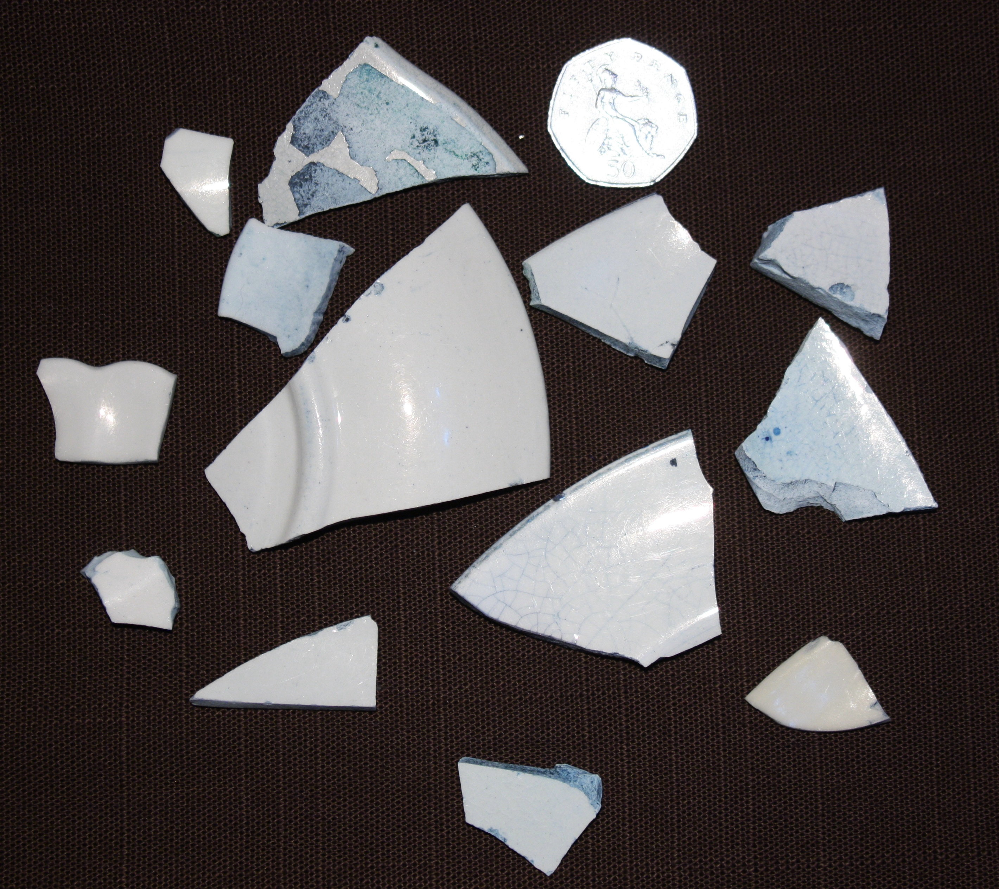

what is this?
1
[1. 0. 0. 0. 0.]
[[1. 0. 0. 0. 0.]]
Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 2.3470 - acc: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 1s 1s/step - loss: 1.9118 - acc: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 1s 1s/step - loss: 1.4545 - acc: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 1s 1s/step - loss: 1.0686 - acc: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 1s 1s/step - loss: 0.7554 - acc: 1.0000
Epoch 6/20
1/1 [==============================] - 1s 1s/step - loss: 0.5307 - acc: 1.0000
Epoch 7/20
1/1 [==============================] - 1s 1s/step - loss: 0.3727 - acc: 1.0000
Epoch 8/20
1/1 [==============================] - 1s 1s/step - loss: 0.2662 - acc: 1.0000
Epoch 9/20
1/1 [==============================] - 1s 1s/step - loss: 0.1946 - acc: 1.0000
Epoch 10/20
1/1 [==============================] - 1s 1s/step - loss: 0.1468 - acc: 1.0000
Epoch 11/20
1/1 [==============

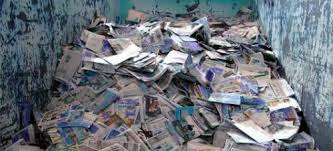

what is this?
4
[0. 0. 0. 1. 0.]
[[0. 0. 0. 1. 0.]]
Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 2.4371 - acc: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 1s 1s/step - loss: 1.9777 - acc: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 1s 1s/step - loss: 1.5053 - acc: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 1s 1s/step - loss: 1.1091 - acc: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 1s 1s/step - loss: 0.7925 - acc: 1.0000
Epoch 6/20
1/1 [==============================] - 1s 1s/step - loss: 0.5530 - acc: 1.0000
Epoch 7/20
1/1 [==============================] - 1s 1s/step - loss: 0.3899 - acc: 1.0000
Epoch 8/20
1/1 [==============================] - 1s 1s/step - loss: 0.2798 - acc: 1.0000
Epoch 9/20
1/1 [==============================] - 1s 1s/step - loss: 0.2050 - acc: 1.0000
Epoch 10/20
1/1 [==============================] - 1s 1s/step - loss: 0.1537 - acc: 1.0000
Epoch 11/20
1/1 [==============

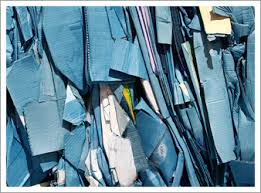

what is this?
4
[0. 0. 0. 1. 0.]
[[0. 0. 0. 1. 0.]]
Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5294 - acc: 1.0000
Epoch 2/20
1/1 [==============================] - 1s 1s/step - loss: 0.4106 - acc: 1.0000
Epoch 3/20
1/1 [==============================] - 1s 1s/step - loss: 0.3095 - acc: 1.0000
Epoch 4/20
1/1 [==============================] - 1s 1s/step - loss: 0.2333 - acc: 1.0000
Epoch 5/20
1/1 [==============================] - 1s 1s/step - loss: 0.1770 - acc: 1.0000
Epoch 6/20
1/1 [==============================] - 1s 1s/step - loss: 0.1367 - acc: 1.0000
Epoch 7/20
1/1 [==============================] - 1s 1s/step - loss: 0.1075 - acc: 1.0000
Epoch 8/20
1/1 [==============================] - 1s 1s/step - loss: 0.0862 - acc: 1.0000
Epoch 9/20
1/1 [==============================] - 1s 1s/step - loss: 0.0707 - acc: 1.0000
Epoch 10/20
1/1 [==============================] - 1s 1s/step - loss: 0.0591 - acc: 1.0000
Epoch 11/20


KeyboardInterrupt: ignored

In [68]:

path1 = "/content/drive/My Drive/trainucscactive/*"
for ss,file in enumerate (glob.glob(path1)):
    ss=ss+1
    print(ss)
    r1= cv2.imread(file)
    r=cv2.cvtColor(r1, cv2.COLOR_BGR2RGB)
    #plt.imshow(r)
    #plt.show()
   # plt.clf()
    #
    img = cv2.resize(r,(224,224))
    img_array = np.array(img)
   
    img_array= img_array.astype('float32')
    img_array=img_array/255.
    
    X_val = np.array([img_array])
    predicted = model.predict(X_val)
    np.reshape(5, 1)
    order =np.sort(predicted ,axis=0)
    #y_prob = model.predict(x) 
    y_classes = predicted.argmax(axis=-1)
    #p=model.predict_classes(X_val)
    print(y_classes)
    
    
    k0=y_classes
    print(k0)
    difference = (order[:,-1] - order[:,-2])
    margin_conf = 1 - difference
    k1=margin_conf

    ratio_conf = order[:,-2] / order[:,-1]
    k2=ratio_conf

    simple_least_conf = np.nanmax(predicted) # most confident prediction, ignoring NaNs
    num_labels = float(predicted.size) # number of labels
    normalized_least_conf = (1 - simple_least_conf) * (num_labels / (num_labels -1))
    k3=np.array([normalized_least_conf])
    entropy=entr(predicted).sum()
    k4=np.array([entropy])
    k5=np.array([k1,k2,k3,k4,k0])
    print(k5.shape)
    #print(k5)
    k6=k5.transpose()
    print(k6)
    
    #fittedModel1 = joblib.load('SVM1.pkl')
    #print(fittedModel1)
    
    p=xgb_model.predict(k6) 
    if p==1:
        cv2_imshow(r)
        #plt.imshow(r)
        cv2.waitKey()
        cv2.destroyAllWindows()
        print("what is this?")
        in1=input()
        class_N=int(in1)
        #print (class_N)
        from keras.utils import np_utils
        Y = np_utils.to_categorical((class_N-1),5)
        print(Y)
        y_val=np.array([Y])
        print(y_val)
        for layer in model.layers[:-1]:#[n_frozen_layers:]:
          layer.trainable=True
        hist = model.fit(X_val, y_val, batch_size=8 , epochs=20, verbose=1)